# Finding the MRI brain tumor detection dataset

Let's find the dataset in this link: https://www.kaggle.com/datasets/navoneel/brain-mri-images-for-brain-tumor-detection

# Import packages

In [224]:
import numpy as np
import torch 
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import glob
import random
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score 
import cv2 
import sys

# Reading the images


In [225]:
healthy = [] 
tumor = [] 
for f in glob.iglob("./data/brain_tumor_dataset/yes/*.jpg"):
    img = cv2.imread(f)
    img = cv2.resize(img, (128,128))
    b, g, r = cv2.split(img)
    img = cv2.merge ([r, g, b])
    tumor.append(img)
    

for f in glob.iglob("./data/brain_tumor_dataset/no/*.jpg"):
    img = cv2.imread(f)
    img = cv2.resize(img, (128,128))
    b, g, r = cv2.split(img)
    img = cv2.merge ([r, g, b])
    healthy.append(img)

In [226]:
healthy = np.array(healthy)
tumor = np.array(tumor)
All = np.concatenate((healthy,tumor))

# Visualizing Brain MRI Images

In [227]:
def plot_random(healthy, tumor, num=5):
    healthy_imgs = healthy[np.random.choice(healthy.shape[0], num, replace=False)]
    tumor_imgs = tumor[np.random.choice(tumor.shape[0], num, replace=False)]
    
    plt.figure(figsize=(16,9))
    for i in range(num):
        plt.subplot(1, num, i+1)
        plt.title('Healthy')
        plt.imshow(healthy_imgs[i])
        
    plt.figure(figsize=(16,9))
    for i in range(num):
        plt.subplot(2, num, i+1)
        plt.title('Tumor')
        plt.imshow(tumor_imgs[i])
        
        

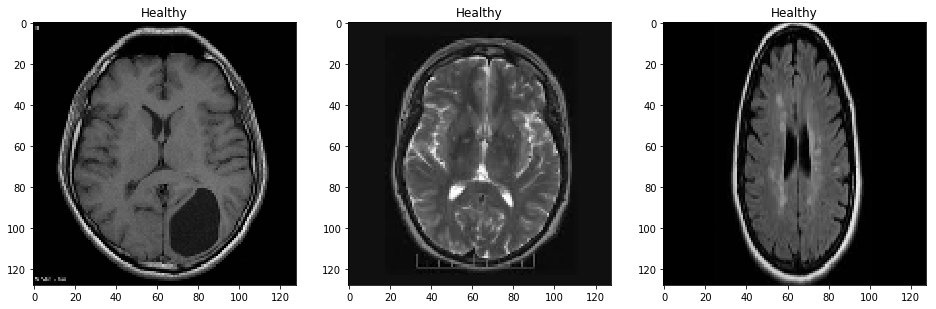

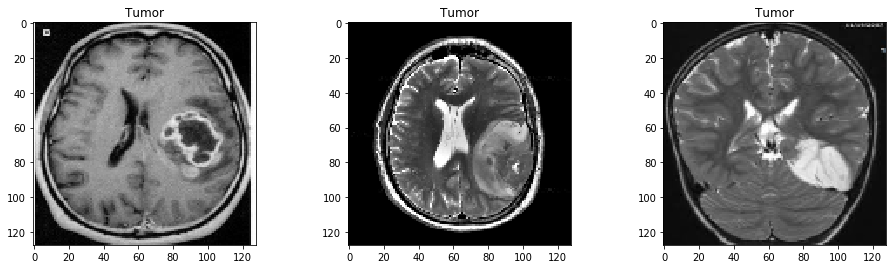

In [228]:
plot_random(healthy,tumor, num=3)

# Create Torch Dataset Class

## What is Pytorch's Abstract Dataset Class

In [229]:
class Dataset(object):
    """an abstract class representing a Dataset.
    All other datasets should subclass it. All sublasses should override 
    '__len__' that provides the size of the dataset and '__getitem__'
    supporting integer indexing in range from 0 to len(self) exclusive."""
    
    def __getitem__(self,index):
        raise NotImplementedError
    
    def __len__(self):
        raise NotImplementedError
    
    def __add__(self,other):
        return ConcatDataset([self,other])
    
    

## Creating MRI custom dataset class


In [230]:
class MRI(Dataset):
    def __init__(self):
        healthy = [] 
        tumor = [] 
        for f in glob.iglob("./data/brain_tumor_dataset/yes/*.jpg"):
            img = cv2.imread(f)
            img = cv2.resize(img, (128,128))
            b, g, r = cv2.split(img)
            img = cv2.merge ([r, g, b])
            img = img.reshape((img.shape[2],img.shape[0],img.shape[1]))
            tumor.append(img)
    

        for f in glob.iglob("./data/brain_tumor_dataset/no/*.jpg"):
            img = cv2.imread(f)
            img = cv2.resize(img, (128,128))
            b, g, r = cv2.split(img)
            img = cv2.merge ([r, g, b])
            img = img.reshape((img.shape[2],img.shape[0],img.shape[1]))
            healthy.append(img)
        
        # our images
        healthy = np.array(healthy, dtype=np.float32)
        tumor = np.array(tumor, dtype=np.float32)
        
        # our labels
        tumor_label = np.ones(tumor.shape[0], dtype=np.float32)
        healthy_label = np.zeros(healthy.shape[0], dtype=np.float32)
        
        # Concatenates

        self.images = np.concatenate((tumor, healthy), axis=0)
        self.labels = np.concatenate((tumor_label,healthy_label))
        
   
    def __len__(self):
        return self.images.shape[0]
   
    def __getitem__(self, index):
        sample = {'image': self.images[index], 'label': self.labels[index]}
        return sample
    
    def normalize(self):
        self.images = self.images/255
        
        

# Creating a Dataloader

## Without a dataloader using for loop

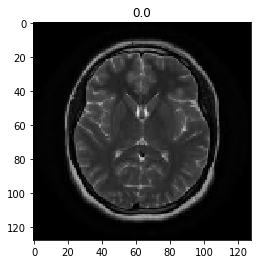

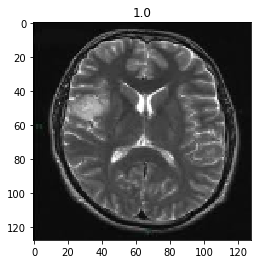

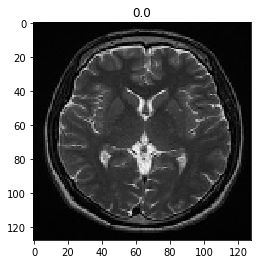

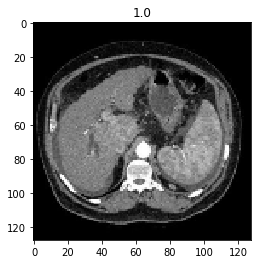

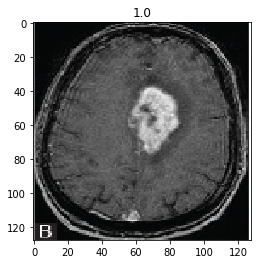

...

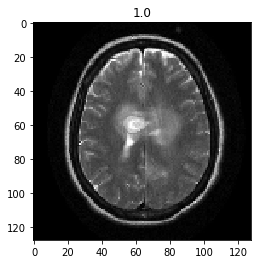

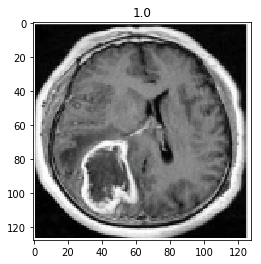

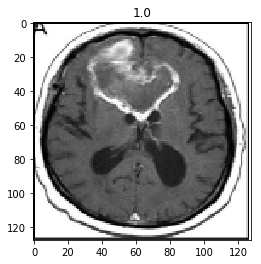

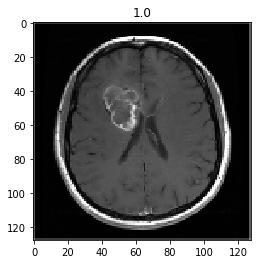

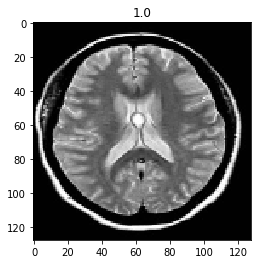

In [131]:
index = list(range(len(mri)))
random.shuffle(index)
for idx in index:
    sample = mri[idx]
    img = sample['image']
    label = sample['label']
    img = img.reshape(img.shape[1],img.shape[2],img.shape[0])
    plt.title(label)
    plt.imshow(img)
    plt.show()

## Using a dataloader

In [231]:
dataloader = DataLoader(mri, shuffle=True)

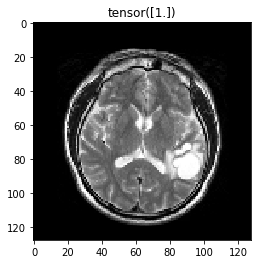

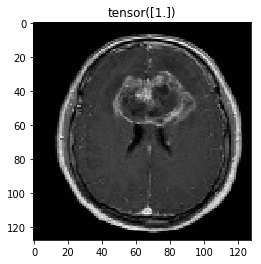

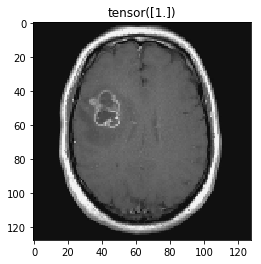

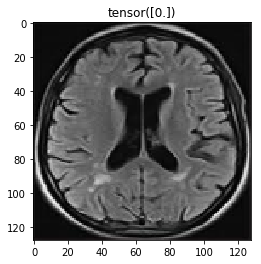

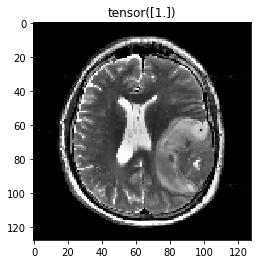

...

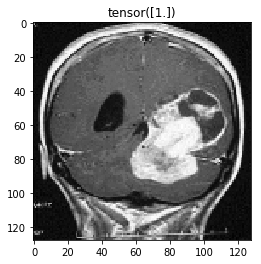

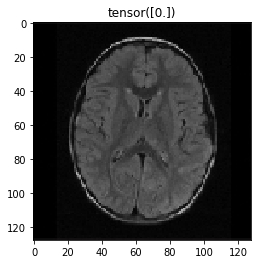

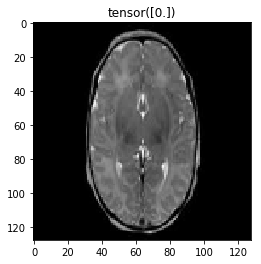

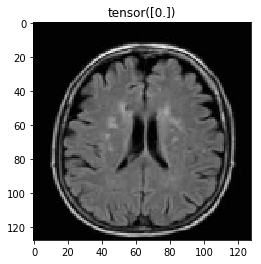

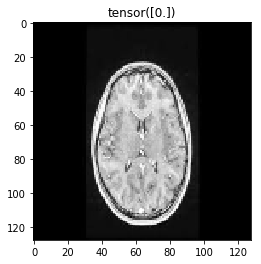

In [232]:
for sample in dataloader:
    img = sample['image'].squeeze()
    label = sample['label']
    img = img.reshape(img.shape[1],img.shape[2],img.shape[0])
    plt.title(label)
    plt.imshow(img)
    plt.show()

# Create a CNN model

In [233]:
import torch.nn as nn
import torch.nn.functional as F

class CNN(nn.Module):
    def __init__(self):
        super(CNN,self).__init__()
        self.cnn_model = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size=2, stride=5),
        nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5),
        nn.Tanh(),
        nn.AvgPool2d(kernel_size=2, stride=5))      
        
        self.fc_model = nn.Sequential(
        nn.Linear(in_features=256, out_features=120),
        nn.Tanh(),
        nn.Linear(in_features=120, out_features=84),
        nn.Tanh(),
        nn.Linear(in_features=84, out_features=1))
        
    def forward(self, x):
        x = self.cnn_model(x)
        x = x.view(x.size(0), -1)
        x = self.fc_model(x)
        x = F.sigmoid(x)
        
        return x
        


# Some Basics of Training of Evaluation in Pytorch


## model.eval()
 - Used particulary for reference, nothing to do with gradients
 - Changese the forward() behaviour of the module is it called up on. eg. it disablels dropout and has batch norm use the entire population statistics. This is necessary for inference.

## model.train()
 - Brings drop out and batch norm to action (i.e., train mode)
 - Gradients are computed

## numpy array vs tensor
The difference between a NumPy array and a tensor array is that tensors are backed by the accelerator memory like GPU and they are immutable, unlike NumPy arrays. You can never update a tensor but create a new one. If you are into machine learning or going to be into it. A Tensor is a suitable choice if you are going to use a GPU. A tensor can reside in accelerator's memory. 
- the numpy arrays are the core functionality of the numpy package designed to support faster mathematical operations. Unlike python's inbuilt list data structure, they can only hold elements of a single data type. Library like pandas which is used for data preprocessing is built around the numpy array. Pytorch tensors are similar to numpy arrays, but can also be operated on CUDA-capable Nvidia GPU.
- Numpy arrays are mainly used in typical machine learning algorithms (such as k-means or Decision Tree in scikit-learn) whereas pytorch tensors are mainly used in deep learning which requires heavy matrix computation. 
- Unlike numpy arrays, while creating pytorch tensor, it also accepts two other arguments called the device_type (whether the computation happens on CPU or GPU) and the requires_grad (which is used to compute the derivatives.)

## torch.tensor vs torch.cuda.tensor
the key difference is just that torch.tensor occupies CPU memory while torch.cuda.tensor occupies GPU memory. Of course operations on a CPU tensor are computed with CPU while operations for the GPU / CUDA tensor are computed on GPU
    

In [234]:
# a device will be 'cuda' if a GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# creating a CPU tensor
cpu_tensor = torch.rand(10)
# moving same tensor to GPU
gpu_tensor = cpu_tensor.to(device)

print(cpu_tensor, cpu_tensor.dtype, type(cpu_tensor), cpu_tensor.type())
print(gpu_tensor, gpu_tensor.dtype, type(gpu_tensor), gpu_tensor.type())

print(cpu_tensor*gpu_tensor)

tensor([0.1890, 0.1031, 0.5732, 0.6824, 0.7839, 0.7886, 0.7062, 0.3128, 0.8825,
        0.4934]) torch.float32 <class 'torch.Tensor'> torch.FloatTensor
tensor([0.1890, 0.1031, 0.5732, 0.6824, 0.7839, 0.7886, 0.7062, 0.3128, 0.8825,
        0.4934]) torch.float32 <class 'torch.Tensor'> torch.FloatTensor
tensor([0.0357, 0.0106, 0.3285, 0.4657, 0.6146, 0.6219, 0.4988, 0.0979, 0.7787,
        0.2435])


As the underlying harware interface is completely different, CPU Tensors are just compatible with CPU Tensor and vice versa GPU Tensors are just compatible to GPU Tensors

### In which scenario is torch.cuda.Tensor() necessary?
When you want to use GPU acceleration (which is must faster in most cases) for your program, you need to use torch.cuda.Tensor, but you have to make sura that ALL tensors you are using are CUDA Tensors, mixing is not possible here.

### tensor.cpu().detach().numpy(): Convert Pytorch tensor to Numpy Array 
As mentioned before, np.ndarray object does not have this extra "computational graph" layer and therefore, when converting a torch.tensor to np.ndarray you must explicitly remove the computational graph of the tensor using the detach() command. cpu() returns a copy of this object in CPU memory.

# Evaluate a New-Born Neural Network

In [235]:
mri_dataset = MRI()
mri_dataset.normalize()
device = torch.device('cpu')
model = CNN().to(device)

In [236]:
dataloader = DataLoader(mri_dataset, batch_size =32, shuffle = False)

In [237]:
model.eval()
outputs = []
y_true = []

with torch.no_grad():
    for D in dataloader:
        image = D['image']
        label = D['label']

        y_hat = model(image)
        outputs.append(y_hat.cpu().detach().numpy())
        y_true.append(label.cpu().detach().numpy())
    
    
    

In [238]:
outputs = np.concatenate(outputs, axis=0).squeeze()
y_true = np.concatenate(y_true, axis=0).squeeze()

In [239]:
def threshold(scores,threshold=0.50, minimum=0, maximum=1.0):
    x = np.array(list(scores))
    x[x >= threshold] = maximum
    x[x < threshold] = minimum
    return x

In [241]:
accuracy_score(y_true, threshold(outputs)) 

0.636734693877551

[Text(0, 0.5, 'Tumor'), Text(0, 1.5, 'Healthy')]

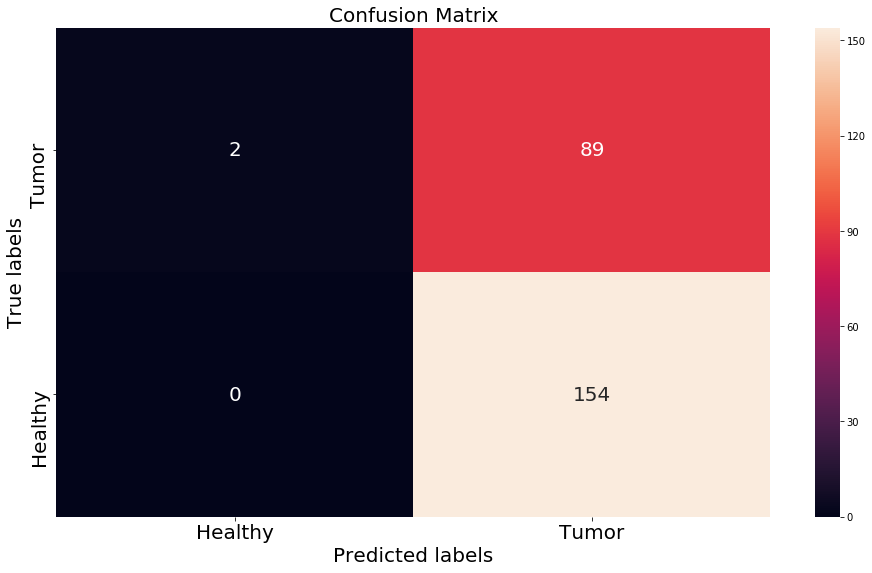

In [242]:
# a better confusion matrix
import seaborn as sns

plt.figure(figsize=(16,9))
cm = confusion_matrix(y_true, threshold(outputs))
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt = 'g', ax=ax, annot_kws={"size": 20})

#Labels, titles and ticks
ax.set_xlabel('Predicted labels', fontsize=20)
ax.set_ylabel('True labels', fontsize=20)
ax.set_title('Confusion Matrix', fontsize=20)
ax.xaxis.set_ticklabels(['Healthy','Tumor'], fontsize=20)
ax.yaxis.set_ticklabels(['Tumor','Healthy'], fontsize=20)

<function matplotlib.pyplot.grid(b=None, which='major', axis='both', **kwargs)>

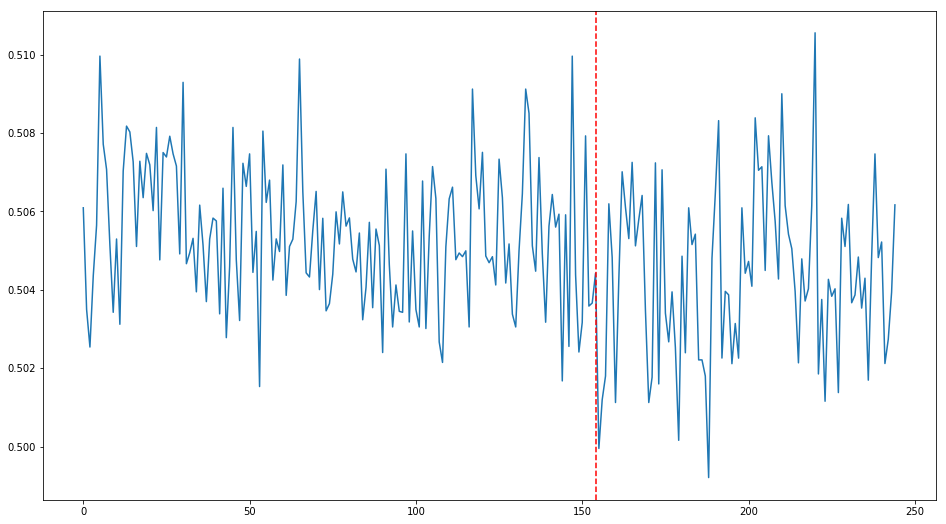

In [243]:
plt.figure(figsize=(16,9))
plt.plot(outputs)
plt.axvline(x=len(tumor), color='r', linestyle='--')
plt.grid

## Train the dumb model


In [244]:
eta = 0.0001
EPOCH = 400
optimizer = torch.optim.Adam(model.parameters(), lr=eta)
dataloader = DataLoader(mri_dataset, batch_size=32, shuffle=True)
model.train()

CNN(
  (cnn_model): Sequential(
    (0): Conv2d(3, 6, kernel_size=(5, 5), stride=(1, 1))
    (1): Tanh()
    (2): AvgPool2d(kernel_size=2, stride=5, padding=0)
    (3): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
    (4): Tanh()
    (5): AvgPool2d(kernel_size=2, stride=5, padding=0)
  )
  (fc_model): Sequential(
    (0): Linear(in_features=256, out_features=120, bias=True)
    (1): Tanh()
    (2): Linear(in_features=120, out_features=84, bias=True)
    (3): Tanh()
    (4): Linear(in_features=84, out_features=1, bias=True)
  )
)

In [245]:
for epoch in range(1, EPOCH):
    losses = []
    for D in dataloader: 
        optimizer.zero_grad() #always reset 
        data = D['image']
        label = D['label']
        y_hat = model(data)
        # define loss function
        error = nn.BCELoss()
        loss = torch.sum(error(y_hat.squeeze(), label))
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
        
    if (epoch+1) % 10 == 0:
        print('Train Epoch: {}\tLoss: {:.6f}'.format(epoch+1, np.mean(losses)))
        

Train Epoch: 10	Loss: 0.627369
Train Epoch: 20	Loss: 0.581054
Train Epoch: 30	Loss: 0.538031
Train Epoch: 40	Loss: 0.526922
Train Epoch: 50	Loss: 0.513191
Train Epoch: 60	Loss: 0.500736
Train Epoch: 70	Loss: 0.477145
Train Epoch: 80	Loss: 0.454418
Train Epoch: 90	Loss: 0.442922
Train Epoch: 100	Loss: 0.432873
Train Epoch: 110	Loss: 0.427249
Train Epoch: 120	Loss: 0.410086
Train Epoch: 130	Loss: 0.394136
Train Epoch: 140	Loss: 0.377952
Train Epoch: 150	Loss: 0.367668
Train Epoch: 160	Loss: 0.342900
Train Epoch: 170	Loss: 0.327636
Train Epoch: 180	Loss: 0.304532
Train Epoch: 190	Loss: 0.287316
Train Epoch: 200	Loss: 0.292135
Train Epoch: 210	Loss: 0.254871
Train Epoch: 220	Loss: 0.230037
Train Epoch: 230	Loss: 0.206940
Train Epoch: 240	Loss: 0.192153
Train Epoch: 250	Loss: 0.170926
Train Epoch: 260	Loss: 0.151214
Train Epoch: 270	Loss: 0.121739
Train Epoch: 280	Loss: 0.112746
Train Epoch: 290	Loss: 0.093642
Train Epoch: 300	Loss: 0.077534
Train Epoch: 310	Loss: 0.063669
Train Epoch: 320	

## Evaluating the smart model

In [246]:
model.eval()
outputs = []
y_true = []

with torch.no_grad():
    for D in dataloader:
        image = D['image']
        label = D['label']

        y_hat = model(image)
        outputs.append(y_hat.cpu().detach().numpy())
        y_true.append(label.cpu().detach().numpy())
        
outputs = np.concatenate(outputs, axis=0)
y_true = np.concatenate(y_true, axis=0)

In [247]:
accuracy_score(y_true, threshold(outputs))

1.0

[Text(0, 0.5, 'Tumor'), Text(0, 1.5, 'Healthy')]

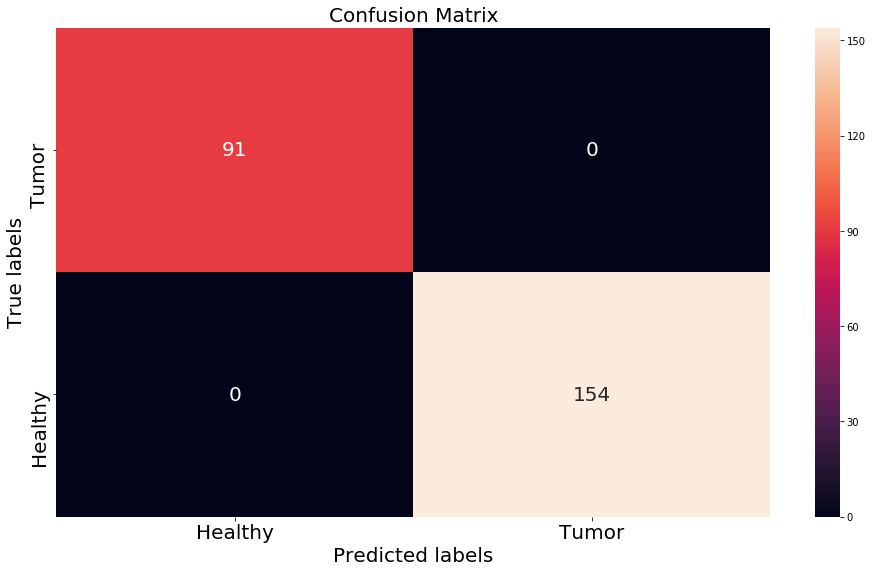

In [248]:
# a better confusion matrix
import seaborn as sns

plt.figure(figsize=(16,9))
cm = confusion_matrix(y_true, threshold(outputs))
ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt = 'g', ax=ax, annot_kws={"size": 20})

#Labels, titles and ticks
ax.set_xlabel('Predicted labels', fontsize=20)
ax.set_ylabel('True labels', fontsize=20)
ax.set_title('Confusion Matrix', fontsize=20)
ax.xaxis.set_ticklabels(['Healthy','Tumor'], fontsize=20)
ax.yaxis.set_ticklabels(['Tumor','Healthy'], fontsize=20)

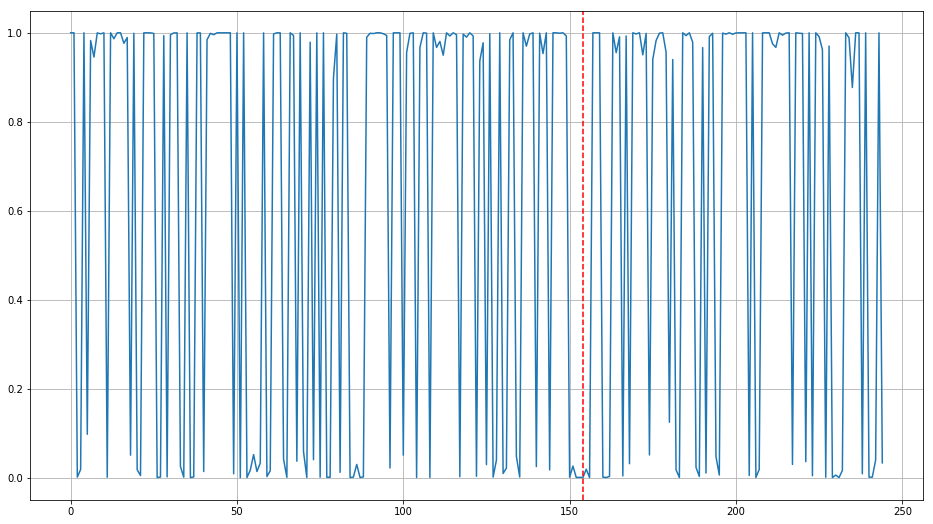

In [249]:
plt.figure(figsize=(16,9))
plt.plot(outputs)
plt.axvline(x=len(tumor), color='r', linestyle='--')
plt.grid()